<a href="https://colab.research.google.com/github/moliver813/Data_Science_Miniprojects/blob/main/ImageExtrapolator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import tensorflow_datasets as tfds
import PIL
import PIL.Image
print(tf.__version__)

2.13.0


In [ ]:
#config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
#session = tf.Session(config=config)


# Old idea: using my own Images
For now, write the links manually
In the future, make a file with a list of links

# New Idea: Use existing TensorFlow Data set
* Want images with scenery, background.

Some options:
https://www.tensorflow.org/datasets/catalog/bigearthnet
  * Satellite imagery, could be interesting

https://www.tensorflow.org/datasets/catalog/places365_small
  * Many places, outdoors and indoors
  * Download size: 29.27 GiB
  * 365 scene categories
  * Entries:
    * Test: 328,500
    * Train: 1,803,460
    * Validation: 36,500


    FeaturesDict({
    'filename': Text(shape=(), dtype=string),
    'image': Image(shape=(256, 256, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=365),})

https://www.tensorflow.org/datasets/catalog/imagenet2012
  * Wide range of images
  * Requires manual download
  * Total size: 155.84 GiB

https://www.tensorflow.org/datasets/catalog/open_images_challenge2019_detection
  * Wide range of images
  * Labels and bounding boxes included
  * Total size: 534.63 GiB

Current Plan:
* Use the places 365 Data Set
* May select a single category to use to start out with, to save time/space with download
* Could use different categories to produce different tunes
* Maybe train with the full data set to produce a general parameter set
  * Then, starting with the same general parameters, use single categories to produce different "tunes"

## Download Images

In [ ]:
#splits = ['train[:70%]','train[70%:]']

#(training_set, validation_set), dataset_info = tfds.load(
#    'places365_small',
#    with_info=True,
#    as_supervised=True,
#    split=splits
#)

# this downloaded train,test,validation data

# Does this only have the training dataset
#ds = tfds.load('places365_small', split='train', shuffle_files=True)
#assert isinstance(ds, tf.data.Dataset)
#print(ds)

# about 30 GB
#dataset_choice = 'places365_small'

# about 1 GB
dataset_choice = 'imagenet_v2'




if dataset_choice == 'places365_small':
#  splits = ['train[:70%]','train[70%:]','validation']
#elif dataset_choice == 'imagenet2012':
#  splits = ['train[:70%]','train[70
  splits = ['train','test','validation']

  (training_set, test_set, validation_set), dataset_info = tfds.load(
      dataset_choice,
      with_info=True,
      as_supervised=True,
      split=splits)


if dataset_choice == 'imagenet_v2':
  splits = ['test[:80%]','test[80%:90%]','test[90%:]']
  (training_set, test_set, validation_set), dataset_info = tfds.load(
      dataset_choice,
      with_info=True,
      as_supervised=True,
      split=splits)



Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imagenet_v2/matched-frequency/3.0.0.incompleteRO8LU6/imagenet_v2-test.tfre…

Dataset imagenet_v2 downloaded and prepared to /root/tensorflow_datasets/imagenet_v2/matched-frequency/3.0.0. Subsequent calls will reuse this data.


In [ ]:

print(dataset_info)

tfds.core.DatasetInfo(
    name='imagenet_v2',
    full_name='imagenet_v2/matched-frequency/3.0.0',
    description="""
    ImageNet-v2 is an ImageNet test set (10 per class) collected by closely
    following the original labelling protocol. Each image has been labelled by at
    least 10 MTurk workers, possibly more, and depending on the strategy used to
    select which images to include among the 10 chosen for the given class there are
    three different versions of the dataset. Please refer to section four of the
    paper for more details on how the different variants were compiled.
    
    The label space is the same as that of ImageNet2012. Each example is represented
    as a dictionary with the following keys:
    
    *   'image': The image, a (H, W, 3)-tensor.
    *   'label': An integer in the range [0, 1000).
    *   'file_name': A unique sting identifying the example within the dataset.
    """,
    homepage='https://github.com/modestyachts/ImageNetV2',
    data_dir=Po

In [ ]:
# prompt: download each image linked to in links_to_images

#import requests

#for link in links_to_images:
#  response = requests.get(link)
#  image_file = open(link.split('/')[-1], "wb")
#  image_file.write(response.content)
#  image_file.close()


In [ ]:
#!ls sample_data
!ls /root/tensorflow_datasets/
!ls /root/tensorflow_datasets/*
#!ls /root/tensorflow_datasets/places365_small/2.1.0
#!ls /root/tensorflow_datasets/places365_small/2.1.0/*00000*
#!cat /root/tensorflow_datasets/places365_small/2.1.0/dataset_info.json

downloads  imagenet_v2
/root/tensorflow_datasets/downloads:
extracted
hugg.co_data_vais_Imag_reso_main_imag-m8MN_35JZFrGeoTI82aIgjNtpWbosMu7yp_w5ODXJynw.tar.gz
hugg.co_data_vais_Imag_reso_main_imag-m8MN_35JZFrGeoTI82aIgjNtpWbosMu7yp_w5ODXJynw.tar.gz.INFO

/root/tensorflow_datasets/imagenet_v2:
matched-frequency


Need to check that code that makes it easy to load sets of images from a directory.

In [ ]:
#print(type(ds))
#print(ds)
print(type(training_set))
print(training_set)

<class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [ ]:
#num_classes = ds[2].features['label'].num_classes



for example in training_set.take(5):
  print(type(example))

  axes = len(example)

  print(len(example))
  if (axes == 2):
    ex0 = example[0]
    ex1 = example[1]
    print("Parts:")
    print(ex0.dtype)
    print(ex1.dtype)

    print(ex0.shape)
    print(ex0.dtype)
    if (ex0.shape == ()):
      print(ex0)

    print(ex1.shape)
    print(ex1.dtype)
    if (ex1.shape == ()):
      print(ex1)


  if (axes == 3):
    ex0 = example[0]
    ex1 = example[1]
    ex2 = example[2]
    print("Parts:")
    #print(type(ex0))
    #print(type(ex1))
    #print(type(ex2))
    print(ex0.dtype)
    print(ex1.dtype)
    print(ex2.dtype)

    print(ex0.shape)
    print(ex0.dtype)
    if (ex0.shape == ()):
      print(ex0)

    print(ex1.shape)
    print(ex1.dtype)
    if (ex1.shape == ()):
      print(ex1)
    print(ex2.shape)
    print(ex2.dtype)
    if (ex2.shape == ()):
      print(ex2)

#  print('Image shape: ', example['image'].shape)
#  print('Label: ', example['label'])
#  print(example['image'].numpy().mean())


<class 'tuple'>
2
Parts:
<dtype: 'uint8'>
<dtype: 'int64'>
(500, 463, 3)
<dtype: 'uint8'>
()
<dtype: 'int64'>
tf.Tensor(742, shape=(), dtype=int64)
<class 'tuple'>
2
Parts:
<dtype: 'uint8'>
<dtype: 'int64'>
(375, 500, 3)
<dtype: 'uint8'>
()
<dtype: 'int64'>
tf.Tensor(636, shape=(), dtype=int64)
<class 'tuple'>
2
Parts:
<dtype: 'uint8'>
<dtype: 'int64'>
(332, 500, 3)
<dtype: 'uint8'>
()
<dtype: 'int64'>
tf.Tensor(217, shape=(), dtype=int64)
<class 'tuple'>
2
Parts:
<dtype: 'uint8'>
<dtype: 'int64'>
(655, 491, 3)
<dtype: 'uint8'>
()
<dtype: 'int64'>
tf.Tensor(946, shape=(), dtype=int64)
<class 'tuple'>
2
Parts:
<dtype: 'uint8'>
<dtype: 'int64'>
(500, 342, 3)
<dtype: 'uint8'>
()
<dtype: 'int64'>
tf.Tensor(421, shape=(), dtype=int64)


## Settings for the project

In [ ]:
# 256 * 256 is the default input image size
# one early target I have is to take a 224 / 256 sample


image_scale_choice = 1


TOTAL_WIDTH  = 256
TOTAL_HEIGHT = 256

SAMPLE_WIDTH  = 224
SAMPLE_HEIGHT = 224


if image_scale_choice == 1:
  TOTAL_WIDTH  = 128
  TOTAL_HEIGHT = 128

  # 224
  SAMPLE_WIDTH  = 96
  SAMPLE_HEIGHT = 96


if image_scale_choice == 2:
  TOTAL_WIDTH  = 64
  TOTAL_HEIGHT = 64

  # 48
  SAMPLE_WIDTH  = 48
  SAMPLE_HEIGHT = 48

if image_scale_choice == 3:
  TOTAL_WIDTH  = 32
  TOTAL_HEIGHT = 32

  # 48
  SAMPLE_WIDTH  = 24
  SAMPLE_HEIGHT = 24





# Assuming square images
CENTRAL_FRACTION = SAMPLE_WIDTH / TOTAL_WIDTH

In [ ]:
enable_count = False
#num_training_examples = 1803460
#num_test_examples = 328500
#num_validation_examples = 36500

num_training_examples = 8000
num_test_examples = 1000
num_validation_examples = 1000


if enable_count:
  num_training_examples = 0
  num_test_examples = 0
  num_validation_examples = 0

  for ex in training_set:
    num_training_examples += 1

  for ex in test_set:
    num_test_examples += 1

  for ex in validation_set:
    num_validation_examples += 1


print(num_training_examples)
print(num_test_examples)
print(num_validation_examples)



8000
1000
1000


## Constructing Data set

May potentially want to apply image preprocessing, especially rotation and cropping before extracting the image sample.

```
from tensorflow.keras.preprocessing.image import ImageDataGenerator
```

Recall that fitting with a TF DataSet, you want the inputs setup to match this:

A tf.data dataset. Should return a tuple of either (inputs, targets) or (inputs, targets, sample_weights).



In [ ]:
# Define a function to take the initial image, return the full image (as a label) and the sample image (as the input for the model)

#def extract_image_sample(image,label):
#def extract_image_sample(X):
def extract_image_sample(image,label,filename=""):
#  image = X['image']
#  label = X['label']
  """
  Extracts the sample from within the image and keeps the full image as the target
  Also keeps track of the label
  """
  # FIXME include an option to scale the image down
  image = tf.image.resize(image,[TOTAL_HEIGHT,TOTAL_WIDTH])
  #sample_image = tf.image.central_crop(image,CENTRAL_FRACTION)

  # save the label as well
  return sample_image, image, label

  image = tf.cast(image,tf.float32) / 255.0
  sample_image = tf.image.central_crop(image,CENTRAL_FRACTION)

  # save the label as well
  return sample_image, image, label

def extract_image_sample_with_flatten(image,label,filename=""):
  """
  Extracts the sample from within the image and keeps the full image as the target, with the target image flatenned
  Also keeps track of the label
  """

  image = tf.image.resize(image,[TOTAL_HEIGHT,TOTAL_WIDTH])
  image = tf.cast(image,tf.float32) / 255.0
  sample_image = tf.image.central_crop(image,CENTRAL_FRACTION)
  #flattened_image = tf.reshape(image,[-1,TOTAL_HEIGHT*TOTAL_WIDTH*3])
  flattened_image = tf.reshape(image,[TOTAL_HEIGHT*TOTAL_WIDTH*3])

  # save the label as well
  return sample_image, flattened_image, label



def reformat_image(image):
  """
  Reformats an image from the flatenned version to the original image
  """
  return tf.reshape(image,[TOTAL_HEIGHT,TOTAL_WIDTH,3])


In [ ]:
#num_training_examples =

enable_shuffle = False

# check what the proper number is. num_training_examples // 4 ?
num_shuffle = 1000

BATCH_SIZE = 100

# training_set, test_set, validation_set

if enable_shuffle:
  train_batches      =   training_set.shuffle(num_shuffle).map(extract_image_sample_with_flatten).batch(BATCH_SIZE).prefetch(1)
  test_batches       =       test_set.shuffle(num_shuffle).map(extract_image_sample_with_flatten).batch(BATCH_SIZE).prefetch(1)
  validation_batches = validation_set.shuffle(num_shuffle).map(extract_image_sample_with_flatten).batch(BATCH_SIZE).prefetch(1)

else:
  train_batches      =   training_set.map(extract_image_sample_with_flatten).batch(BATCH_SIZE).prefetch(1)
  test_batches       =       test_set.map(extract_image_sample_with_flatten).batch(BATCH_SIZE).prefetch(1)
  validation_batches = validation_set.map(extract_image_sample_with_flatten).batch(BATCH_SIZE).prefetch(1)






<class 'tuple'>
Input image sample
(100, 96, 96, 3)
Output image sample for fitting
(100, 49152)
Reformatted image 0 from batch
(128, 128, 3)
Label
(100,)




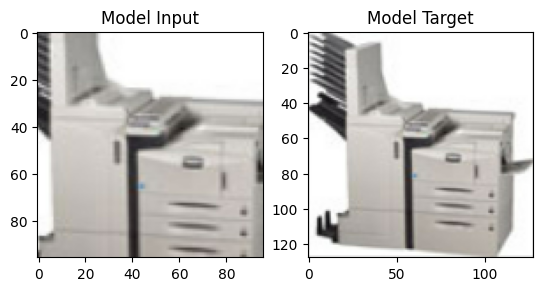

In [ ]:
for ex in train_batches.take(1):
  print(type(ex))
  print("Input image sample")
  print(ex[0].shape)
  print("Output image sample for fitting")
  print(ex[1].shape)
  refomatted_image = reformat_image(ex[1][0])
  print("Reformatted image 0 from batch")
  print(refomatted_image.shape)
  print("Label")
  print(ex[2].shape)
  print("\n")

  plt.subplot(1,2,1)
  plt.imshow(ex[0][0])
  plt.title("Model Input")
  plt.subplot(1,2,2)
  plt.imshow(refomatted_image)
  plt.title("Model Target")

#  plt.subplots_adjust(hspace = 0.3)
#  plt.imshow(image_batch[n])
#  color = "blue" if predicted_ids[n] == label_batch[n] else "red"
#  plt.title(predicted_class_names[n].title(), color=color)
#  plt.axis('off')


## Building the Model

I will start with a simple sequential definition to get started.
I plan to create more complicated topogies to reflect the fact that all the details of the input should be included in the output.

Reminder for myself of how to build a model with the functional API


```
inputs = keras.Input(shape=(784,), name="digits")
x = layers.Dense(64, activation="relu", name="dense_1")(inputs)
x = layers.Dense(64, activation="relu", name="dense_2")(x)
outputs = layers.Dense(10, activation="softmax", name="predictions")(x)

model = keras.Model(inputs=inputs, outputs=outputs)
```



More Ideas to include:
spatial dropout: https://www.tensorflow.org/api_docs/python/tf/keras/layers/SpatialDropout2D

Or maybe this is not a good idea for this case.

Obvious to include:
CNN

Could also try https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose

Also known as deconvolution.




One very complicated feature to implement would be to get the raw input mapped to the final nodes. I have tried mapping the full input to the full output, but this does add a lot of parameters that aren't needed. Would it be possible to fix those parameters so each original pixel would connect only to the corresponding final pixel? This would not be that efficient, as the program would still do the math for all the zero weights. But that math with the weight*vector computation is relatively simple.

It would probably make more sense to force the outputs to be the original values in that region, but that would be hard to do within the model. For optimal performance, the best thing to do would be to rework the project so only the edge pixels are actually fitted at all.

Another idea: create a layer that 0 pads the input to match the final resolution. Then it may be possible to do convolutional layers all the way, without a final dense layer.
This could be done with this function, though it would have to be implemented inside a layer. Could that be done with a lambda layer?

https://www.tensorflow.org/api_docs/python/tf/image/pad_to_bounding_box

or

https://www.tensorflow.org/api_docs/python/tf/image/resize_with_crop_or_pad

or

https://www.tensorflow.org/api_docs/python/tf/keras/layers/ZeroPadding2D


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 96, 96, 3)]       0         
                                                                 
 zero_padding2d (ZeroPaddin  (None, 128, 128, 3)       0         
 g2D)                                                            
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 128)     401536    
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 128)     2769024   
                                                                 
 conv2d_transpose (Conv2DTr  (None, 128, 128, 3)       64899     
 anspose)                                                    

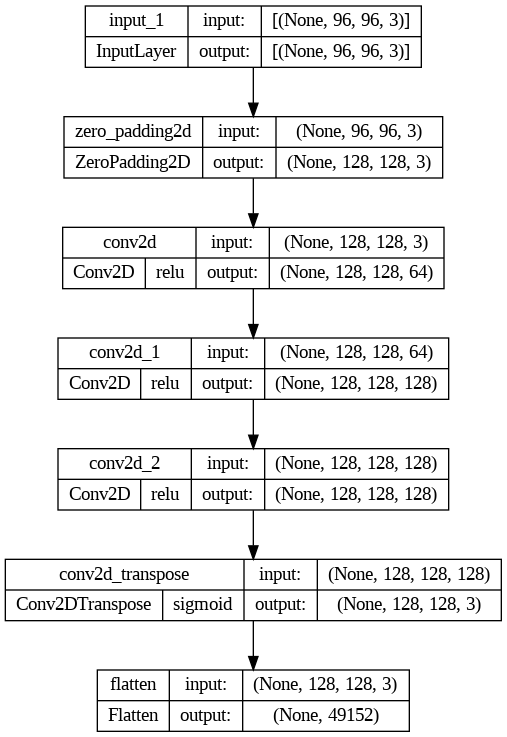

In [ ]:

# first version, defined sequentially
#model = tf.keras.Sequential([
#    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3)),
#    tf.keras.layers.Dense(2048,activation='relu'),
#    tf.keras.layers.Dense(TOTAL_WIDTH*TOTAL_WIDTH*3, activation='relu')
#])

model_file_path = "model.keras"

# load existing model
model_version = -1

# shallow network
model_version = 0

# One CNN
model_version = 1

# Two CNNs
model_version = 2

# Three CNNs
model_version = 3

# Three CNNs with skipping
model_version = 4

# Three CNNs with skipping and dropout
model_version = 5

# Attempting to use padding and CNNs to avoid
# dense layers
model_version = 6

# Pure CNN, with larger sizes.
model_version = 7

# second version, defined functionally
def create_model():

  if model_version == -1: # load existing model
    model = tf.keras.models.load_model(model_file_path)
    return model

  inputs = tf.keras.Input(shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))
  #x = tf.keras.layers.Conv2D(32, (3,3), activation='relu')(inputs)
  #outputs = create_output_layer(x)

  if (model_version == 0):

    flattenned_input = tf.keras.layers.Flatten()(inputs)
    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(flattenned_input)

  if (model_version == 1):
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(inputs)
    #x = tf.keras.layers.Conv3D(32,(3,3,3),activation='relu')(inputs)
    x = tf.keras.layers.Flatten()(x)
    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(x)

  if (model_version == 2):
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(inputs)
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(x)
    x = tf.keras.layers.Flatten()(x)
    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(x)

  if (model_version == 3):
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(inputs)
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(x)
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(x)
    x = tf.keras.layers.Flatten()(x)
    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(x)

  if (model_version == 4):
    layer1_output = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(inputs)
    layer2_output = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(layer1_output)
    layer3_output = tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(layer2_output)

    layer_1_output_flattenned = tf.keras.layers.Flatten()(layer1_output)
    layer_2_output_flattenned = tf.keras.layers.Flatten()(layer2_output)
    layer_3_output_flattenned = tf.keras.layers.Flatten()(layer3_output)

    x = tf.keras.layers.Concatenate(axis=-1)([layer_1_output_flattenned,layer_2_output_flattenned,layer_3_output_flattenned])

    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(x)

  if (model_version == 5):
    layer1_output = tf.keras.layers.Conv2D(64, (3,3), activation='relu',padding="same",input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(inputs)
    layer1_output = tf.keras.layers.Dropout(rate = 0.3)(layer1_output)

    layer2_output = tf.keras.layers.Conv2D(64, (5,5), activation='relu',padding="same",input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(layer1_output)
    layer2_output = tf.keras.layers.Dropout(rate = 0.3)(layer2_output)

    layer3_output = tf.keras.layers.Conv2D(64, (7,7), activation='relu',padding="same",input_shape=(SAMPLE_WIDTH, SAMPLE_HEIGHT, 3))(layer2_output)
    layer3_output = tf.keras.layers.Dropout(rate = 0.3)(layer3_output)

    layer_1_output_flattenned = tf.keras.layers.Flatten()(layer1_output)
    layer_2_output_flattenned = tf.keras.layers.Flatten()(layer2_output)
    layer_3_output_flattenned = tf.keras.layers.Flatten()(layer3_output)

    x = tf.keras.layers.Concatenate(axis=-1)([layer_1_output_flattenned,layer_2_output_flattenned,layer_3_output_flattenned])

    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(x)


  if (model_version == 6):
    symmetric_padding_distance = int((TOTAL_HEIGHT - SAMPLE_HEIGHT) / 2)
    x = tf.keras.layers.ZeroPadding2D(padding=symmetric_padding_distance)(inputs)
    layer1_output = tf.keras.layers.Conv2D(64,(3,3),activation='relu',padding='same',input_shape=(TOTAL_WIDTH, TOTAL_HEIGHT, 3))(x)

    layer2_output = tf.keras.layers.Conv2D(128,(5,5),activation='relu',padding='same',input_shape=(TOTAL_WIDTH, TOTAL_HEIGHT, 3))(layer1_output)

    layer3_output = tf.keras.layers.Conv2D(128,(7,7),activation='relu',padding='same',input_shape=(TOTAL_WIDTH, TOTAL_HEIGHT, 3))(layer2_output)

    # should be sigmoid if this is the final output
    layer_3_output_deconv = tf.keras.layers.Conv2DTranspose(3,(3,3),activation='sigmoid',padding='same')(layer3_output)

#    layer_3_output_flattenned = tf.keras.layers.Flatten()(layer3_output)
    x = tf.keras.layers.Flatten()(layer_3_output_deconv)
    outputs = x
#    outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='sigmoid')(x)
  if (model_version == 7):
    symmetric_padding_distance = int((TOTAL_HEIGHT - SAMPLE_HEIGHT) / 2)
    x = tf.keras.layers.ZeroPadding2D(padding=symmetric_padding_distance)(inputs)



    layer1_output = tf.keras.layers.Conv2D(64,(3,3),activation='relu',padding='same',input_shape=(TOTAL_WIDTH, TOTAL_HEIGHT, 3))(x)
    layer2_output = tf.keras.layers.Conv2D(128,(7,7),activation='relu',padding='same',input_shape=(TOTAL_WIDTH, TOTAL_HEIGHT, 3))(layer1_output)
    layer3_output = tf.keras.layers.Conv2D(128,(13,13),activation='relu',padding='same',input_shape=(TOTAL_WIDTH, TOTAL_HEIGHT, 3))(layer2_output)

    # should be sigmoid if this is the final output
    layer_3_output_deconv = tf.keras.layers.Conv2DTranspose(3,(13,13),activation='sigmoid',padding='same')(layer3_output)

#    layer_3_output_flattenned = tf.keras.layers.Flatten()(layer3_output)
    x = tf.keras.layers.Flatten()(layer_3_output_deconv)
    outputs = x

  #x = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='relu')(flattenned_input)

  ##x = tf.keras.layers.Dense(8*TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='relu')(x)
  ##x = tf.keras.layers.Dropout(rate=0.5)(x)
  ##x = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='relu')(x)

  # concatenate the raw input and this
  #x = tf.keras.layers.Concatenate(axis=-1)([flattenned_input, x])

  #outputs = tf.keras.layers.Dense(TOTAL_HEIGHT*TOTAL_WIDTH*3, activation='relu')(x)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  return model

model = create_model()
model.compile(
    optimizer='adam',
    loss='mean_squared_error',
    metrics=['mean_squared_error'],
    weighted_metrics=[]
)

    #loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    #metrics=['accuracy']
#)

# Summarize Model
model.summary()
tf.keras.utils.plot_model(model, "model_outline.png", show_shapes=True,show_layer_activations=True)

with 1013123 params, we hit 12.7 GB

In [ ]:
print(32*32*3)

3072


## Training the Model

This seems run fastest on the V100 High-RAM


What is the best way to train the model?
Is it easy to set it up to train with the (256,256,3) target? Do I have to flatten either the output or the input?



In [ ]:
EPOCHS = 12
history = model.fit(train_batches,epochs=EPOCHS,validation_data=validation_batches)

Epoch 1/12
80/80 [==============================] - 231s 3s/step - loss: 8.5140 - mean_squared_error: 0.0159 - val_loss: 8.7754 - val_mean_squared_error: 0.0161
Epoch 2/12
80/80 [==============================] - 231s 3s/step - loss: 8.4718 - mean_squared_error: 0.0159 - val_loss: 8.7942 - val_mean_squared_error: 0.0162
Epoch 3/12
80/80 [==============================] - 231s 3s/step - loss: 8.4656 - mean_squared_error: 0.0159 - val_loss: 8.7597 - val_mean_squared_error: 0.0161
Epoch 4/12
80/80 [==============================] - 231s 3s/step - loss: 8.4395 - mean_squared_error: 0.0158 - val_loss: 8.7993 - val_mean_squared_error: 0.0162
Epoch 5/12
80/80 [==============================] - 231s 3s/step - loss: 8.5267 - mean_squared_error: 0.0160 - val_loss: 8.8230 - val_mean_squared_error: 0.0162
Epoch 6/12
80/80 [==============================] - 230s 3s/step - loss: 8.4215 - mean_squared_error: 0.0158 - val_loss: 8.7671 - val_mean_squared_error: 0.0161
Epoch 7/12
80/80 [================

In [ ]:
# Save the model

model.save("model.keras")
# model = keras.models.load_model('path/to/location.keras')

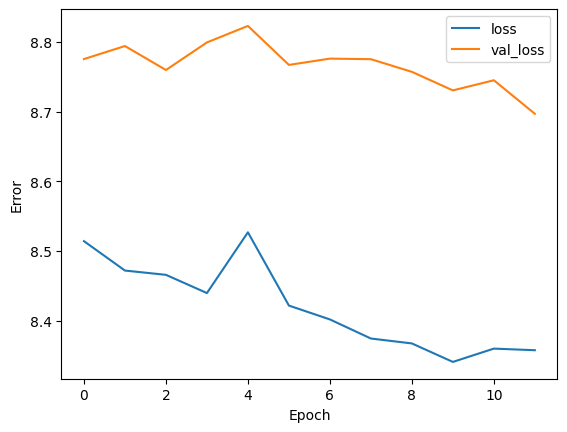

In [ ]:
print(history)

#plt.plot(history.history['mean_squared_error'], label='mean_squared_error')
#plt.plot(history.history['val_mean_squared_error'], label='val_mean_squared_error')
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.legend()
plt.savefig('fit_history.png')

## Checking some results

I would like to check some results with example images from the test dataset first.
Then, download or upload images from outside of the entire data set and see what the code does.

Some code examples for loading and saving images with PIL


```
from PIL import Image  # Import Image class from library.


image = Image.open("example.jpg")  # Load image.
cropped_image = image.crop((100, 100, 250, 250))  # Crop the image.
cropped_image.save("example_cropped.jpg")  # Save the image.
```

For plotting images in the notebook:
https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html

Note that imshow already allows the usage of float (0-1) values for the RGB.



Example 0:
Sample Image: (100, 96, 96, 3)
Image: (100, 49152)
Label: (100,)
tf.Tensor(
[859 446 656 623 835 549 654 509 349  20 228 349 364 772 556 223   9 511
 347 464 252 757 273 836 441  82 641 107 531  14   8 239 125 912 513 508
 123 778 653 957  16 546 293 869 659 527 831 785  48 640 780 894  68 476
 282  49 769 773  46 624 617 658 207 147 120 318 503 825 527 199 377 636
 904 714 187 946  74 793 304 862 196 709 381   6 411 826 318 762 954 322
 989 661 993 718 140 214 247 607 291 500], shape=(100,), dtype=int64)
4/4 [==============================] - 0s 92ms/step
tf.Tensor(
[[[0.3927142  0.4003576  0.3753557 ]
  [0.38005581 0.3870709  0.3587644 ]
  [0.37592342 0.38241687 0.35247687]
  ...
  [0.48127854 0.4852985  0.45758015]
  [0.46818623 0.47111723 0.44984806]
  [0.43265006 0.43824115 0.4128812 ]]

 [[0.38206366 0.39057532 0.3641047 ]
  [0.37791377 0.38480327 0.35727558]
  [0.38657683 0.3918975  0.363577  ]
  ...
  [0.5650278  0.56968576 0.5460561 ]
  [0.54988796 0.55500484 0.5388

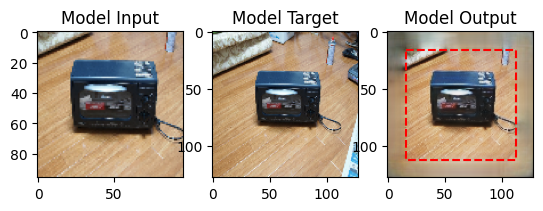

In [ ]:
# Plot some examples from the validation set
# use validation_batches


def plot_image(image):

  plt.imshow(image)

def plot_overlay(ax):
  """
  Plot an overlay showing the region that was used for fitting.
  """
  x_values = [(TOTAL_WIDTH-SAMPLE_WIDTH)*0.5,  (TOTAL_WIDTH+SAMPLE_WIDTH)*0.5,
              (TOTAL_WIDTH+SAMPLE_WIDTH)*0.5,  (TOTAL_WIDTH-SAMPLE_WIDTH)*0.5,
              (TOTAL_WIDTH-SAMPLE_WIDTH)*0.5]
  y_values = [(TOTAL_HEIGHT-SAMPLE_HEIGHT)*0.5,(TOTAL_HEIGHT-SAMPLE_HEIGHT)*0.5,
              (TOTAL_HEIGHT+SAMPLE_HEIGHT)*0.5,(TOTAL_HEIGHT+SAMPLE_HEIGHT)*0.5,
              (TOTAL_HEIGHT-SAMPLE_HEIGHT)*0.5]
  ax.plot(x_values,y_values,color='red',linestyle='--')

enable_overlay = True


for i,ex in enumerate(validation_batches.take(1)):
  sample_image, image, label = ex

  print(f"Example {i}:")
  print(f"Sample Image: {sample_image.shape}")
  print(f"Image: {image.shape}")
  print(f"Label: {label.shape}")

  print(label)

  # Need reversal of flatenning to plot the sample image

  local_batch_size = sample_image.shape[0]

  #for j in range(local_batch_size):
  # plot_image(sample_image[j])

  target_images = list(map(reformat_image,image))
  predicted_images = list(map(reformat_image,model.predict(sample_image)))


  ex_image_index = 0
  print(predicted_images[ex_image_index])

  plt.subplot(1,3,1)
  plot_image(sample_image[ex_image_index])
  plt.title("Model Input")

  plt.subplot(1,3,2)
  plot_image(target_images[ex_image_index])
  plt.title("Model Target")

  ax = plt.subplot(1,3,3)
  plot_image(predicted_images[ex_image_index])
  if (enable_overlay):
    plot_overlay(ax)
  plt.title("Model Output")



  plt.savefig(f"results_example_{i}_single.png")

Example 0:
Sample Image: (100, 96, 96, 3)
Image: (100, 49152)
Label: (100,)
tf.Tensor(
[859 446 656 623 835 549 654 509 349  20 228 349 364 772 556 223   9 511
 347 464 252 757 273 836 441  82 641 107 531  14   8 239 125 912 513 508
 123 778 653 957  16 546 293 869 659 527 831 785  48 640 780 894  68 476
 282  49 769 773  46 624 617 658 207 147 120 318 503 825 527 199 377 636
 904 714 187 946  74 793 304 862 196 709 381   6 411 826 318 762 954 322
 989 661 993 718 140 214 247 607 291 500], shape=(100,), dtype=int64)
4/4 [==============================] - 0s 97ms/step
Example 1:
Sample Image: (100, 96, 96, 3)
Image: (100, 49152)
Label: (100,)
tf.Tensor(
[431 818   9 151 670 406 174 655 205 329 128 357 906 329 595 804 685 750
 922 468 531 229 580  77 245 973 802 396 916 484 875 307 103 935 352 101
 383 544 906 954 937 892 911 570 403 858 189 250 655 732 330 263 798 233
 866 406 738 892 763 881 524 969 426 289 377 875 328 664 369 601 830 279
 308 632 737 837 674 669 525 540 909 283 110 59

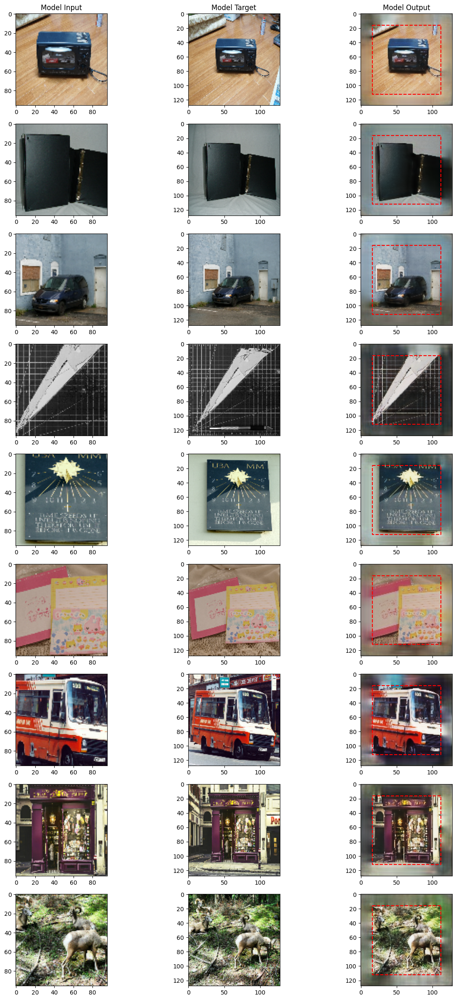

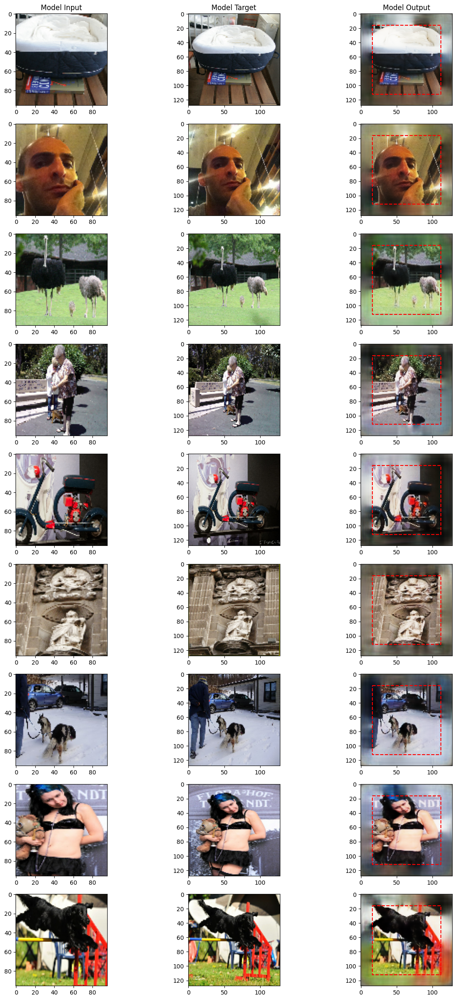

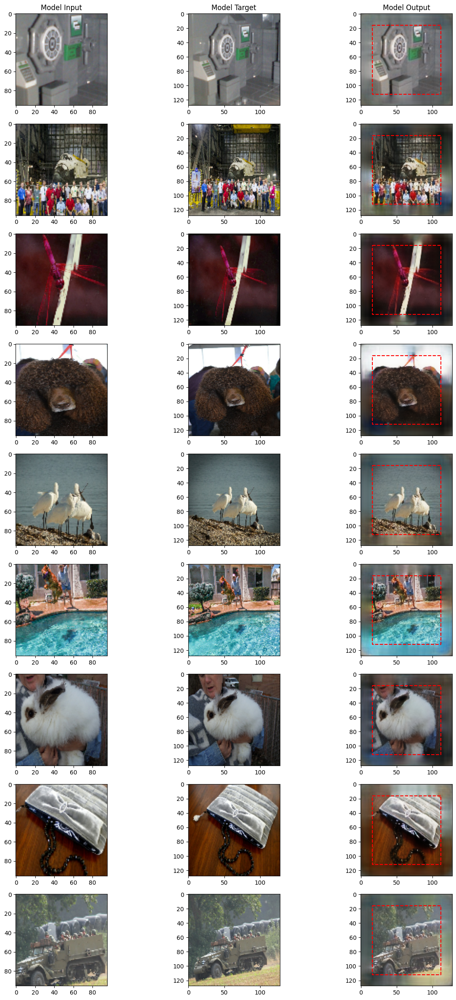

In [ ]:


for i,ex in enumerate(validation_batches.take(3)):
  sample_image, image, label = ex

  print(f"Example {i}:")
  print(f"Sample Image: {sample_image.shape}")
  print(f"Image: {image.shape}")
  print(f"Label: {label.shape}")

  print(label)

  # Need reversal of flatenning to plot the sample image

  local_batch_size = sample_image.shape[0]

  #for j in range(local_batch_size):
  # plot_image(sample_image[j])

  target_images = list(map(reformat_image,image))
  predicted_images = list(map(reformat_image,model.predict(sample_image)))

  ex_image_index = 0
  n_images_to_show = 9
  n_images_to_show = min(n_images_to_show,local_batch_size)

  fig, axs = plt.subplots(n_images_to_show, 3,figsize=(15,30))
  for j in range(n_images_to_show):
    #plt.subplots_adjust(hspace = 0.3)

    axs[j,0].imshow(sample_image[j])
    if (j==0):
      axs[j,0].set_title("Model Input")

    axs[j,1].imshow(target_images[j])
    if (j==0):
      axs[j,1].set_title("Model Target")

    axs[j,2].imshow(predicted_images[j])
    if (j==0):
      axs[j,2].set_title("Model Output")
    if (enable_overlay):
      plot_overlay(ax=axs[j,2])
  plt.savefig(f"results_example_{i}.png")

Example 0:
Sample Image: (100, 96, 96, 3)
Image: (100, 49152)
Label: (100,)
tf.Tensor(
[742 636 217 946 421 353 710 572 429 115 581 103 549 798 789 608 495 783
 209 921 348 809 997 222 484 840 397 888 840 957 238 233  36 705 626 899
  24  31 856 862 102 600 994 374 580 896 557 570 911 363 504 947 150 528
 524 268 415 689  25  69 109 481 228 681 329 502 337 746 769 540 742 625
 177 630 700 915 218  57 145 939 753 158 971 663  42 103  80 440 583 976
 711 426 553 728 877 306 141 550  91 466], shape=(100,), dtype=int64)
4/4 [==============================] - 0s 102ms/step
Example 1:
Sample Image: (100, 96, 96, 3)
Image: (100, 49152)
Label: (100,)
tf.Tensor(
[187 362 138 154 624 316 391 765 764 689 416 810 957 998   1 895 403 787
 903 861 995 533 793 693  93 894 422 582 380 723 526 607 463 949  71  40
  53 310 887 232 374 488 646 841 706 422 872 400 649 198 225 774  88 625
 220 585 588 457 150 212 815 700 998 849 784 833   6 634 953 118 787 283
  46 843 782 899 721 328 711 804 244 753 313 7

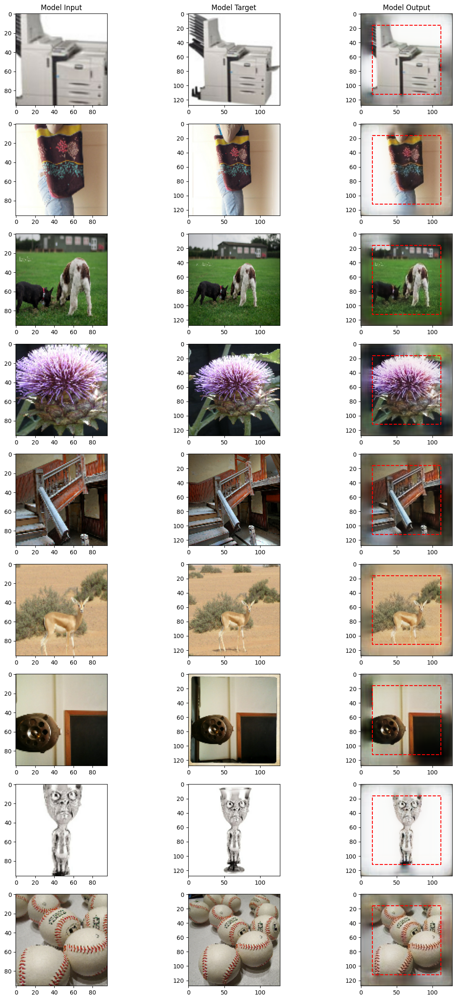

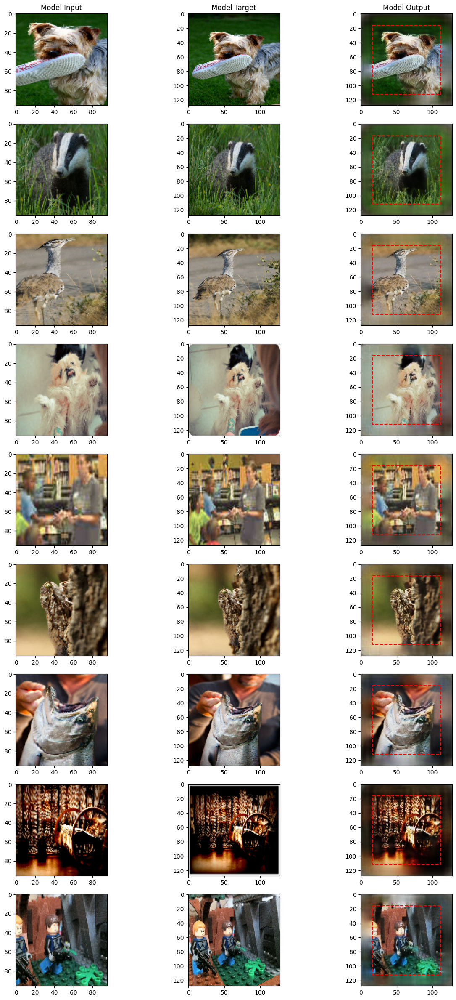

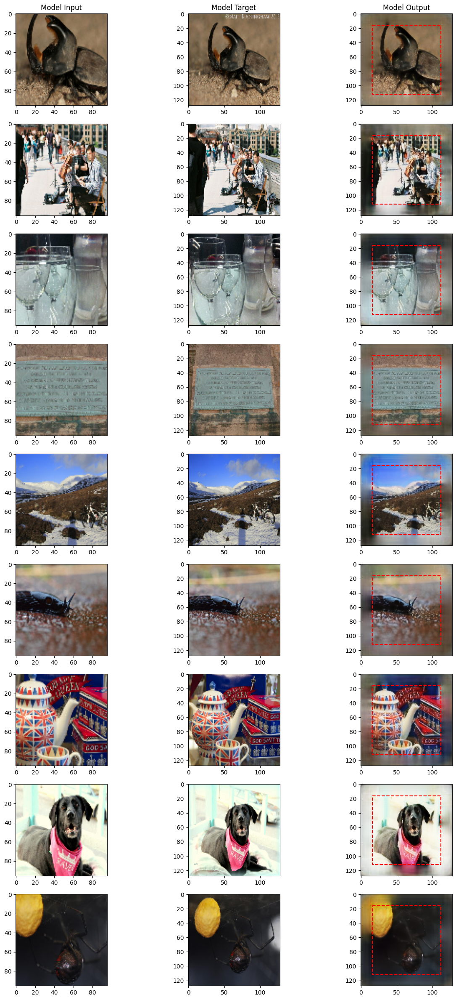

In [ ]:
# Check how it did in the training data


for i,ex in enumerate(train_batches.take(1)):
  sample_image, image, label = ex

  print(f"Example {i}:")
  print(f"Sample Image: {sample_image.shape}")
  print(f"Image: {image.shape}")
  print(f"Label: {label.shape}")

  print(label)

  # Need reversal of flatenning to plot the sample image

  local_batch_size = sample_image.shape[0]

  target_images = list(map(reformat_image,image))
  predicted_images = list(map(reformat_image,model.predict(sample_image)))

  ex_image_index = 0
  n_images_to_show = 9
  n_images_to_show = min(n_images_to_show,local_batch_size)

  fig, axs = plt.subplots(n_images_to_show, 3,figsize=(15,30))
  for j in range(n_images_to_show):
    #plt.subplots_adjust(hspace = 0.3)

    axs[j,0].imshow(sample_image[j])
    if (j==0):
      axs[j,0].set_title("Model Input")

    axs[j,1].imshow(target_images[j])
    if (j==0):
      axs[j,1].set_title("Model Target")

    axs[j,2].imshow(predicted_images[j])
    if (j==0):
      axs[j,2].set_title("Model Output")
    if (enable_overlay):
      plot_overlay(ax=axs[j,2])
  plt.savefig(f"results_training_example_{i}.png")

In [ ]:
# Display some of the filters within the CNN

# model

for layer in model.layers:

  if 'conv' not in layer.name:
    continue
  filters, biases = layer.get_weights()
  print(filters.shape)

  # does this AI gen code work?
  # normalize filter values to 0-1 so we can visualize them
  f_min, f_max = filters.min(), filters.max()

  print(f"{layer.name} : {type(layer)}")
  num_filters = filters.shape[2]
  print(f"Num Filters = {num_filters}")
  for i in range(num_filters):
    filter_indiv = filters[:,:,i,:]
    #print(filter_indiv)


  # plot first few filters
  #fig = plt.figure(figsize=(15,15))
  #for i in range(num_filters):


(3, 3, 3, 64)
conv2d : <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
Num Filters = 3
(7, 7, 64, 128)
conv2d_1 : <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
Num Filters = 64
(13, 13, 128, 128)
conv2d_2 : <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
Num Filters = 128
(13, 13, 3, 128)
conv2d_transpose : <class 'keras.src.layers.convolutional.conv2d_transpose.Conv2DTranspose'>
Num Filters = 3
